# COVID-19 Data Analysis: Visualization Library Comparison

This notebook demonstrates different Python visualization libraries using COVID-19 data:
- **Matplotlib**: Static, publication-quality plots
- **Seaborn**: Statistical visualizations with beautiful defaults
- **Plotly**: Interactive, web-based visualizations
- **Bokeh**: Interactive plots with server-side capabilities
- **hvPlot**: High-level API for quick interactive plots

Each section showcases the strengths and use cases for each library.

In [1]:
# Import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import HoverTool
from bokeh.layouts import column
import hvplot.pandas
from pathlib import Path
import sys

# Enable Bokeh in notebook
output_notebook()

# Add project root to path and import config
project_root = Path('.').resolve().parent
sys.path.insert(0, str(project_root))
import config

# Set up data path using config
data_path = project_root / config.data_dir

# Set default styles
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

Loading BokehJS ...

In [2]:
# Load COVID-19 data using config paths
try:
    # Use config.py for path - works across different systems
    file_path = data_path / "owid-covid-data.csv"
    
    print(f"Loading data from: {file_path}")
    
    # Load only critical columns + first 100k rows for quick exploration
    df = pd.read_csv(
        file_path,
        usecols=['date', 'location', 'new_cases', 'total_deaths', 'total_cases'],
        parse_dates=['date'],
        nrows=100000
    )
    print("✓ Loaded successfully!")
    print(f"  Rows: {len(df):,}")
    print(f"  Columns: {list(df.columns)}")
    print("\nFirst 5 rows:")
    print(df.head())

except FileNotFoundError:
    print(f"❌ Data file not found at: {file_path}")
    print(f"\n💡 To get the data:")
    print(f"   1. Download from: https://github.com/owid/covid-19-data")
    print(f"   2. Save to: {data_path}/")
    print(f"   3. Or create a Data/ directory and place the CSV there")
except Exception as e:
    print(f"❌ Error: {e}")

Loading data from: /Users/john/Python/PublicHealthPortfolio/my-projects/covid19-tracker/Data/owid-covid-data.csv
✓ Loaded successfully!
  Rows: 100,000
  Columns: ['location', 'date', 'total_cases', 'new_cases', 'total_deaths']

First 5 rows:
      location       date  total_cases  new_cases  total_deaths
0  Afghanistan 2020-01-05          0.0        0.0           0.0
1  Afghanistan 2020-01-06          0.0        0.0           0.0
2  Afghanistan 2020-01-07          0.0        0.0           0.0
3  Afghanistan 2020-01-08          0.0        0.0           0.0
4  Afghanistan 2020-01-09          0.0        0.0           0.0


In [3]:
# Task 1: Load and Explore the Complete Dataset
try:
    # Use config.py path - portable across systems
    file_path = data_path / "owid-covid-data.csv"
    
    print("Loading complete dataset...")
    print(f"Path: {file_path}\n")
    
    # Load full dataset
    df = pd.read_csv(file_path, parse_dates=['date'])
    
    # Display first few rows
    print("First 5 rows:")
    print(df.head())
    
    # Dataset structure
    print("\nDataset structure:")
    print(df.info())
    
    # Missing values
    print("\nMissing values:")
    print(df.isnull().sum())

except FileNotFoundError:
    print(f"❌ Data file not found at: {file_path}")
    print(f"\n💡 Download the data from:")
    print(f"   https://github.com/owid/covid-19-data/tree/master/public/data")
    print(f"   Save as: {data_path}/owid-covid-data.csv")
except Exception as e:
    print(f"\n❌ Error loading data: {e}")

Loading complete dataset...
Path: /Users/john/Python/PublicHealthPortfolio/my-projects/covid19-tracker/Data/owid-covid-data.csv

First 5 rows:
  iso_code continent     location       date  total_cases  new_cases  \
0      AFG      Asia  Afghanistan 2020-01-05          0.0        0.0   
1      AFG      Asia  Afghanistan 2020-01-06          0.0        0.0   
2      AFG      Asia  Afghanistan 2020-01-07          0.0        0.0   
3      AFG      Asia  Afghanistan 2020-01-08          0.0        0.0   
4      AFG      Asia  Afghanistan 2020-01-09          0.0        0.0   

   new_cases_smoothed  total_deaths  new_deaths  new_deaths_smoothed  ...  \
0                 NaN           0.0         0.0                  NaN  ...   
1                 NaN           0.0         0.0                  NaN  ...   
2                 NaN           0.0         0.0                  NaN  ...   
3                 NaN           0.0         0.0                  NaN  ...   
4                 NaN           0.0    

In [4]:
# Task 2: Basic Data Analysis
try:
    # Basic statistics
    print("\nBasic statistics for numerical columns:")
    print(df.describe())
    
    # Group by location and get mean cases
    print("\nAverage new cases by location:")
    avg_cases = df.groupby('location')['new_cases'].mean().sort_values(ascending=False)
    print(avg_cases.head(10))
    
    # Latest data snapshot
    print("\nLatest data snapshot:")
    latest_date = df['date'].max()
    latest_data = df[df['date'] == latest_date]
    print(latest_data.head())

except Exception as e:
    print(f"\nAnalysis error: {e}")


Basic statistics for numerical columns:
                                date   total_cases     new_cases  \
count                         429300  4.118040e+05  4.101590e+05   
mean   2022-04-20 18:45:38.515723264  7.365292e+06  8.017360e+03   
min              2020-01-01 00:00:00  0.000000e+00  0.000000e+00   
25%              2021-03-05 00:00:00  6.280750e+03  0.000000e+00   
50%              2022-04-20 00:00:00  6.365300e+04  0.000000e+00   
75%              2023-06-08 00:00:00  7.582720e+05  0.000000e+00   
max              2024-08-04 00:00:00  7.758668e+08  4.423623e+07   
std                              NaN  4.477582e+07  2.296649e+05   

       new_cases_smoothed  total_deaths     new_deaths  new_deaths_smoothed  \
count        4.089290e+05  4.118040e+05  410608.000000        409378.000000   
mean         8.041026e+03  8.125957e+04      71.852139            72.060828   
min          0.000000e+00  0.000000e+00       0.000000             0.000000   
25%          0.000000e+00  4.3

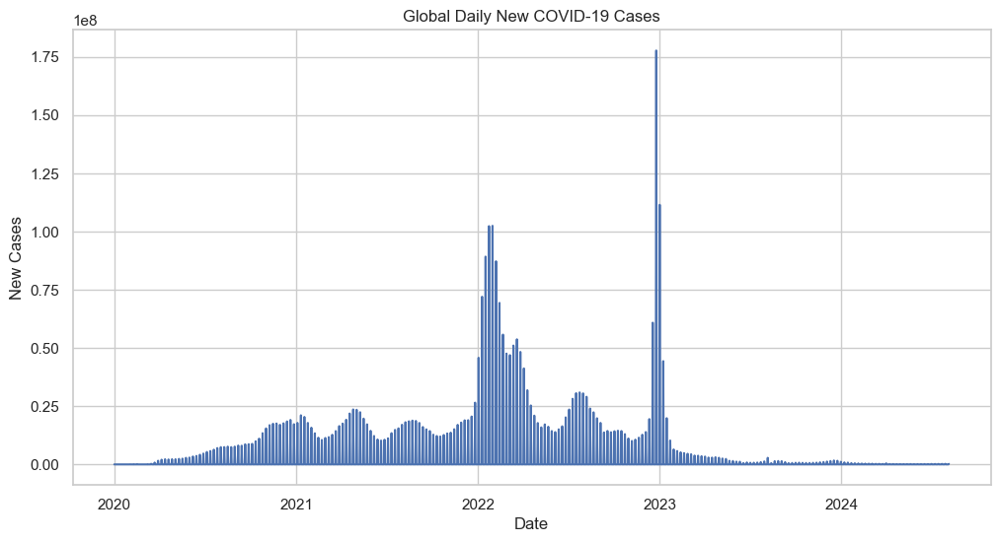

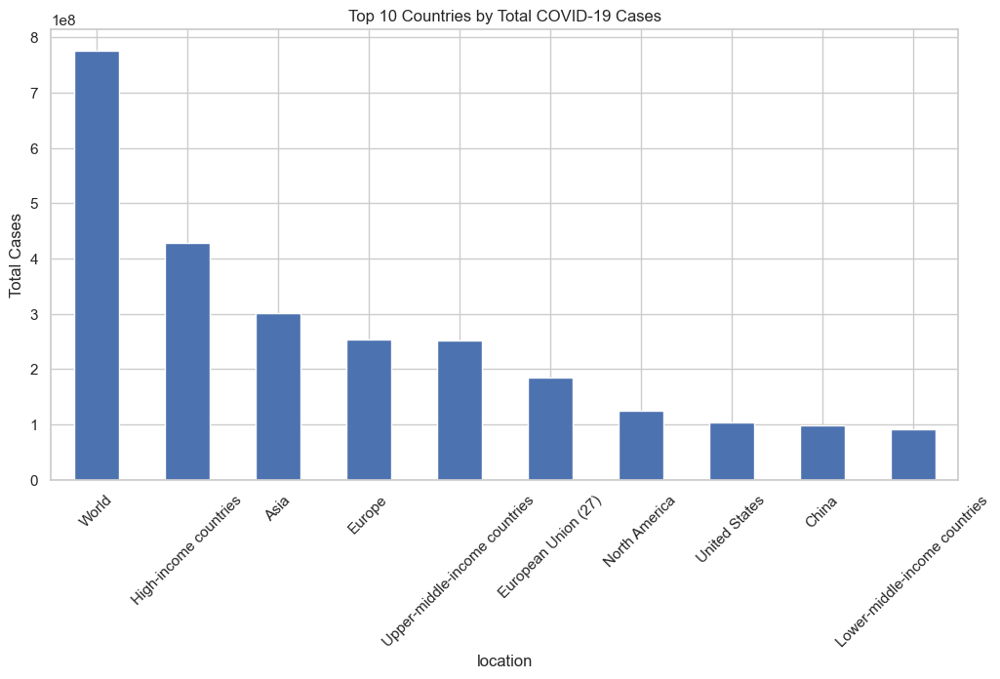

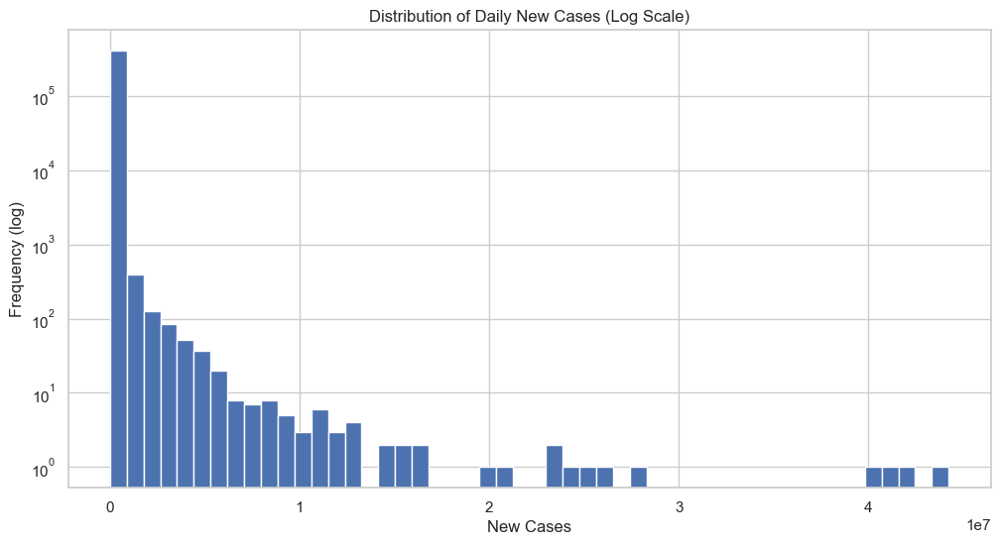

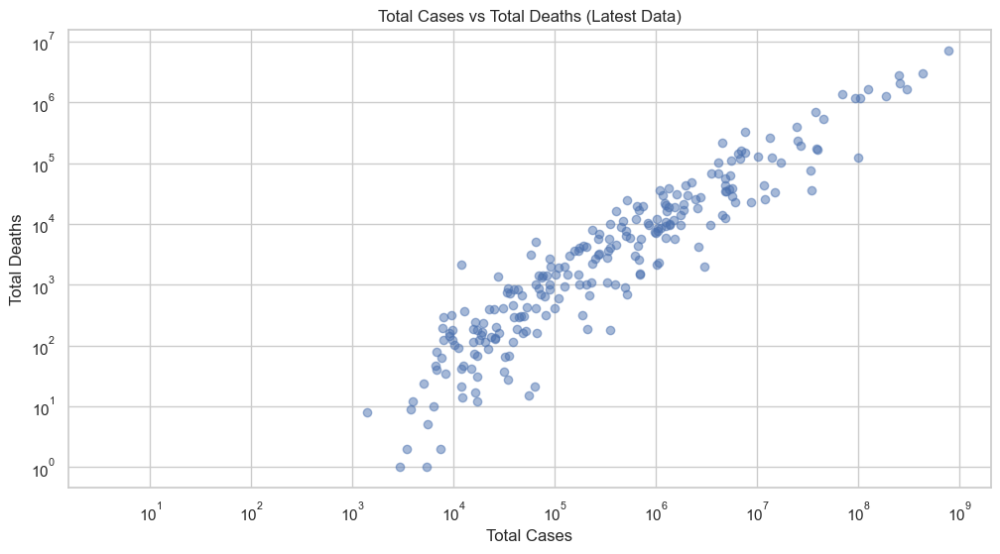

In [5]:
# Task 3: Data Visualization
try:
    # Set larger figure size for better visibility
    plt.rcParams['figure.figsize'] = (12, 6)
    
    # 1. Line chart - Global new cases over time
    global_cases = df.groupby('date')['new_cases'].sum()
    plt.plot(global_cases.index, global_cases.values)
    plt.title('Global Daily New COVID-19 Cases')
    plt.xlabel('Date')
    plt.ylabel('New Cases')
    plt.grid(True)
    plt.show()
    
    # 2. Bar chart - Top 10 countries by total cases
    top_countries = df.groupby('location')['total_cases'].max().nlargest(10)
    top_countries.plot(kind='bar')
    plt.title('Top 10 Countries by Total COVID-19 Cases')
    plt.ylabel('Total Cases')
    plt.xticks(rotation=45)
    plt.show()
    
    # 3. Histogram - Distribution of new cases
    plt.hist(df['new_cases'].dropna(), bins=50, log=True)
    plt.title('Distribution of Daily New Cases (Log Scale)')
    plt.xlabel('New Cases')
    plt.ylabel('Frequency (log)')
    plt.show()
    
    # 4. Scatter plot - Total cases vs total deaths
    latest = df[df['date'] == df['date'].max()]
    plt.scatter(latest['total_cases'], latest['total_deaths'], alpha=0.5)
    plt.title('Total Cases vs Total Deaths (Latest Data)')
    plt.xlabel('Total Cases')
    plt.ylabel('Total Deaths')
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True)
    plt.show()

except Exception as e:
    print(f"\nVisualization error: {e}")

---

## 📊 Matplotlib: The Foundation

**Best for:**
- Publication-quality static plots
- Fine-grained control over every element
- Exporting to PDF, SVG, or image formats
- Scientific papers and reports

**Tradeoffs:**
- ✅ Highly customizable, mature ecosystem
- ✅ Works offline, no web dependencies
- ✅ Excellent for printed materials
- ❌ Verbose syntax for complex plots
- ❌ Static (no interactivity)
- ❌ Requires more code for styling

---

## 🎨 Seaborn: Statistical Beauty

**Best for:**
- Statistical visualizations (distributions, correlations, regression)
- Attractive defaults out of the box
- Categorical data analysis
- Quick exploratory data analysis

**Tradeoffs:**
- ✅ Beautiful statistical plots with minimal code
- ✅ Built on matplotlib (same export options)
- ✅ Excellent for data science workflows
- ✅ Great color palettes and themes
- ❌ Static (no interactivity)
- ❌ Less flexible than pure matplotlib
- ❌ Limited plot types compared to matplotlib

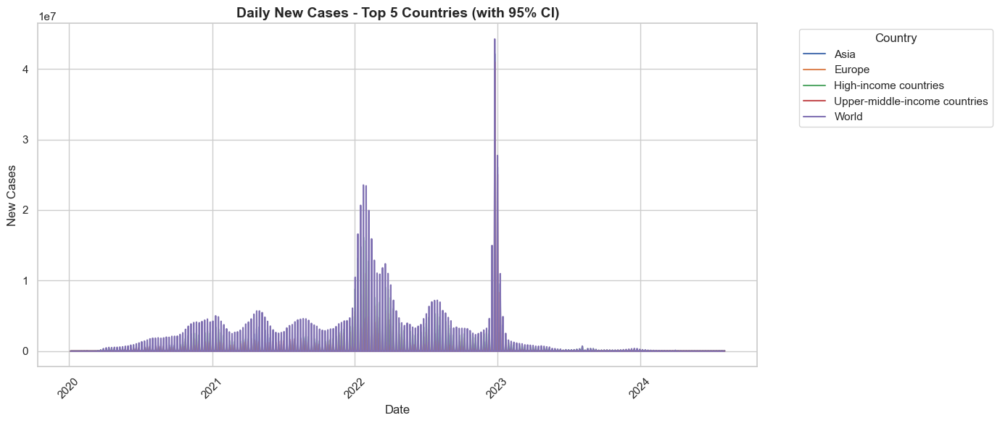

✓ Seaborn automatically adds confidence intervals and beautiful styling


In [6]:
# Seaborn Example 1: Distribution plot with multiple variables
try:
    # Prepare data for top 5 countries
    top_5_countries = df.groupby('location')['total_cases'].max().nlargest(5).index
    df_top5 = df[df['location'].isin(top_5_countries)].copy()
    
    # Time series with confidence intervals
    plt.figure(figsize=(14, 6))
    sns.lineplot(data=df_top5, x='date', y='new_cases', hue='location', errorbar=('ci', 95))
    plt.title('Daily New Cases - Top 5 Countries (with 95% CI)', fontsize=14, fontweight='bold')
    plt.xlabel('Date')
    plt.ylabel('New Cases')
    plt.xticks(rotation=45)
    plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    print("✓ Seaborn automatically adds confidence intervals and beautiful styling")
    
except Exception as e:
    print(f"Seaborn plot error: {e}")

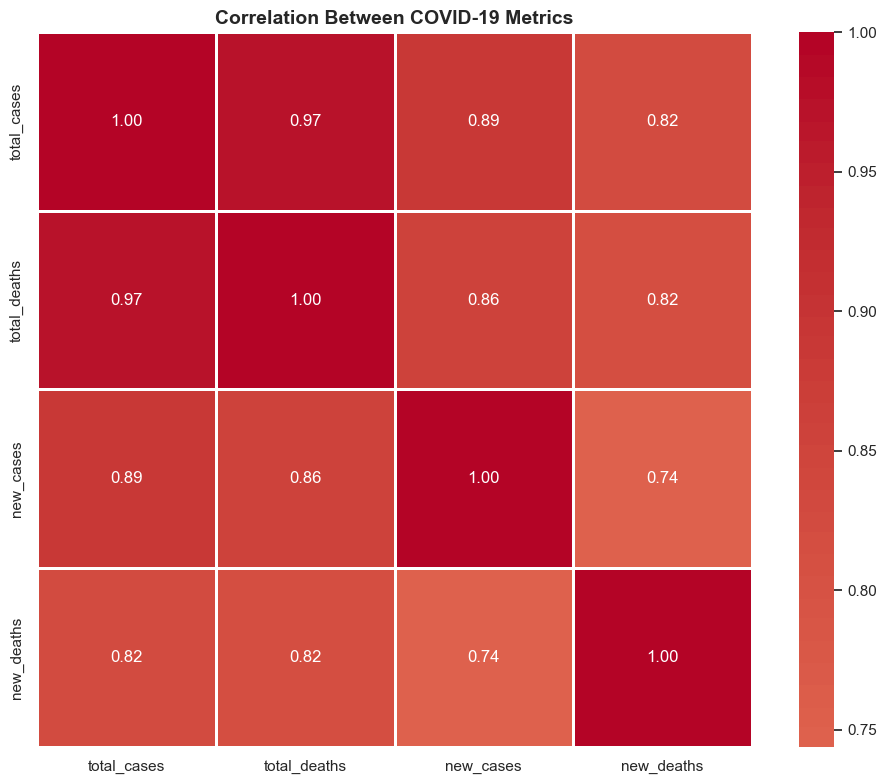

✓ Seaborn excels at statistical visualizations like correlation matrices


In [7]:
# Seaborn Example 2: Correlation heatmap
try:
    # Get latest snapshot with relevant numeric columns
    latest = df[df['date'] == df['date'].max()].copy()
    
    # Select numeric columns for correlation
    numeric_cols = ['total_cases', 'total_deaths', 'new_cases', 'new_deaths']
    corr_data = latest[numeric_cols].dropna()
    
    # Create correlation matrix
    plt.figure(figsize=(10, 8))
    correlation = corr_data.corr()
    sns.heatmap(correlation, annot=True, fmt='.2f', cmap='coolwarm', 
                center=0, square=True, linewidths=1)
    plt.title('Correlation Between COVID-19 Metrics', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print("✓ Seaborn excels at statistical visualizations like correlation matrices")
    
except Exception as e:
    print(f"Correlation plot error: {e}")

---

## ⚡ Plotly: Interactive Web Visualizations

**Best for:**
- Interactive dashboards and web applications
- Hover tooltips and zoom capabilities
- Sharing visualizations online
- Business presentations and reports

**Tradeoffs:**
- ✅ Highly interactive (zoom, pan, hover, select)
- ✅ Beautiful, professional appearance
- ✅ Easy to embed in web pages
- ✅ Good 3D plotting capabilities
- ❌ Larger file sizes when saved
- ❌ Requires JavaScript (web dependency)
- ❌ Can be slower with very large datasets
- ❌ Limited customization vs matplotlib

In [8]:
# Plotly Example 1: Interactive time series with range slider
try:
    # Aggregate global data over time
    global_data = df.groupby('date').agg({
        'new_cases': 'sum',
        'new_deaths': 'sum',
        'total_cases': 'sum'
    }).reset_index()
    
    # Create interactive plot with multiple traces
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=global_data['date'],
        y=global_data['new_cases'],
        name='New Cases',
        line=dict(color='steelblue', width=2),
        hovertemplate='<b>Date</b>: %{x}<br><b>New Cases</b>: %{y:,.0f}<extra></extra>'
    ))
    
    fig.add_trace(go.Scatter(
        x=global_data['date'],
        y=global_data['new_deaths'],
        name='New Deaths',
        line=dict(color='crimson', width=2),
        yaxis='y2',
        hovertemplate='<b>Date</b>: %{x}<br><b>New Deaths</b>: %{y:,.0f}<extra></extra>'
    ))
    
    # Add range slider and buttons
    fig.update_layout(
        title='Global COVID-19 Daily Cases and Deaths (Interactive)',
        xaxis=dict(
            title='Date',
            rangeslider=dict(visible=True),
            type='date'
        ),
        yaxis=dict(title='New Cases', side='left', showgrid=False),
        yaxis2=dict(title='New Deaths', side='right', overlaying='y', showgrid=False),
        hovermode='x unified',
        height=600,
        template='plotly_white'
    )
    
    fig.show()
    
    print("✓ Try hovering, zooming, and using the range slider below the chart!")
    
except Exception as e:
    print(f"Plotly plot error: {e}")

✓ Try hovering, zooming, and using the range slider below the chart!


In [9]:
# Plotly Example 2: Animated bubble chart
try:
    # Prepare data for animation - sample every 30 days to reduce complexity
    df_sorted = df.sort_values('date')
    dates = df_sorted['date'].unique()[::30]  # Every 30 days
    
    # Get top 20 countries by total cases for animation
    top_20_countries = df.groupby('location')['total_cases'].max().nlargest(20).index
    df_anim = df[df['location'].isin(top_20_countries) & df['date'].isin(dates)].copy()
    
    # Remove rows with NaN in new_cases and ensure positive values for size
    df_anim = df_anim.dropna(subset=['new_cases', 'total_cases', 'total_deaths'])
    df_anim['new_cases_size'] = df_anim['new_cases'].clip(lower=1)
    
    # Create animated bubble chart
    fig = px.scatter(
        df_anim,
        x='total_cases',
        y='total_deaths',
        size='new_cases_size',
        color='location',
        animation_frame='date',
        animation_group='location',
        hover_name='location',
        hover_data={'total_cases': ':,.0f', 'total_deaths': ':,.0f', 'new_cases': ':,.0f', 'new_cases_size': False},
        log_x=True,
        log_y=True,
        size_max=60,
        range_x=[100, df_anim['total_cases'].max() * 2],
        range_y=[1, df_anim['total_deaths'].max() * 2],
        title='COVID-19 Evolution: Total Cases vs Deaths Over Time',
        labels={'total_cases': 'Total Cases (log)', 'total_deaths': 'Total Deaths (log)'}
    )
    
    fig.update_layout(height=700, template='plotly_white')
    fig.show()
    
    print("✓ Click the Play button to see how countries evolved over time!")
    print("✓ Bubble size represents daily new cases")
    
except Exception as e:
    print(f"Animation error: {e}")

✓ Click the Play button to see how countries evolved over time!
✓ Bubble size represents daily new cases


---

## 🎯 Bokeh: Server-Capable Interactive Plots

**Best for:**
- Standalone interactive HTML files
- Real-time streaming data applications
- Python-based web servers (Flask, Django)
- Large datasets with downsampling

**Tradeoffs:**
- ✅ Can run Python callbacks on server
- ✅ Excellent performance with large data
- ✅ Standalone HTML exports (no external dependencies)
- ✅ Real-time data streaming support
- ❌ More verbose API than Plotly
- ❌ Steeper learning curve
- ❌ Smaller community than Plotly/matplotlib
- ❌ Requires Bokeh server for advanced features

In [10]:
# Bokeh Example: Interactive multi-line chart with hover tooltips
try:
    from bokeh.palettes import Category20
    from bokeh.models import Legend
    
    # Prepare data for top 10 countries
    top_10 = df.groupby('location')['total_cases'].max().nlargest(10).index
    df_top10 = df[df['location'].isin(top_10)].copy()
    
    # Create figure
    p = figure(
        title='COVID-19 Daily New Cases - Top 10 Countries',
        x_axis_label='Date',
        y_axis_label='New Cases',
        x_axis_type='datetime',
        width=900,
        height=500,
        toolbar_location='above'
    )
    
    # Add hover tool
    hover = HoverTool(
        tooltips=[
            ('Country', '@location'),
            ('Date', '@date{%F}'),
            ('New Cases', '@new_cases{0,0}')
        ],
        formatters={'@date': 'datetime'},
        mode='vline'
    )
    p.add_tools(hover)
    
    # Plot each country
    colors = Category20[20]
    legend_items = []
    
    for idx, country in enumerate(top_10):
        country_data = df_top10[df_top10['location'] == country].copy()
        country_data = country_data.sort_values('date')
        
        line = p.line(
            x='date',
            y='new_cases',
            source=country_data,
            line_width=2,
            color=colors[idx],
            alpha=0.8,
            muted_alpha=0.1
        )
        
        legend_items.append((country, [line]))
    
    # Add interactive legend
    legend = Legend(items=legend_items, location='top_right', click_policy='mute')
    p.add_layout(legend, 'right')
    
    p.grid.grid_line_alpha = 0.3
    show(p)
    
    print("✓ Hover over lines to see details. Click legend items to mute/unmute countries!")
    
except Exception as e:
    print(f"Bokeh plot error: {e}")

✓ Hover over lines to see details. Click legend items to mute/unmute countries!


---

## 🚀 hvPlot: Pandas + Interactivity Made Easy

**Best for:**
- Quick exploratory data analysis
- Minimal code for interactive plots
- Working with pandas DataFrames
- Prototyping and experimentation

**Tradeoffs:**
- ✅ Simplest API (.hvplot() method on DataFrames)
- ✅ Automatically handles pandas indexes and types
- ✅ Built on Bokeh/Plotly (inherits their interactivity)
- ✅ Great for rapid prototyping
- ❌ Less control than underlying libraries
- ❌ Limited customization options
- ❌ Smaller community and documentation
- ❌ Additional dependency layer

In [11]:
# hvPlot Example 1: One-line interactive time series
try:
    # Aggregate global daily data
    global_daily = df.groupby('date')[['new_cases', 'new_deaths']].sum().reset_index()
    
    # Create interactive plot with just one line of code!
    display(global_daily.hvplot.line(
        x='date',
        y=['new_cases', 'new_deaths'],
        title='Global COVID-19 Cases and Deaths (hvPlot)',
        ylabel='Count',
        legend='top_left',
        height=400,
        width=900,
        line_width=2,
    ))
except Exception as e:
    print(f"hvPlot error: {e}")

:NdOverlay   [Variable]
   :Curve   [date]   (value)

In [12]:
# hvPlot Example 2: Interactive scatter with grouping
try:
    # Get latest data for top 15 countries
    top_15 = df.groupby('location')['total_cases'].max().nlargest(15).index
    latest_top15 = df[df['date'] == df['date'].max()].copy()
    latest_top15 = latest_top15[latest_top15['location'].isin(top_15)]
    
    # Create interactive scatter plot with minimal code
    display(latest_top15.hvplot.scatter(
        x='total_cases',
        y='total_deaths',
        by='location',
        size=100,
        title='Total Cases vs Deaths - Top 15 Countries (Latest)',
        logx=True,
        logy=True,
        height=500,
        width=900,
        legend='right',
        hover_cols=['location', 'total_cases', 'total_deaths'],
        alpha=0.7
    ))
except Exception as e:
    print(f"hvPlot scatter error: {e}")

:NdOverlay   [location]
   :Scatter   [total_cases]   (total_deaths,location)

---

## 📋 Summary: When to Use Each Library

### Decision Matrix

| **Use Case** | **Recommended Library** | **Why?** |
|-------------|------------------------|----------|
| **Academic papers/publications** | Matplotlib | Publication-quality, precise control, standard format |
| **Quick data exploration** | hvPlot or Seaborn | Minimal code, fast iteration |
| **Statistical analysis** | Seaborn | Built-in statistical plots, beautiful defaults |
| **Interactive dashboards** | Plotly | Rich interactivity, professional appearance |
| **Real-time data streams** | Bokeh | Server callbacks, efficient updates |
| **Large datasets** | Bokeh | Better performance with downsampling |
| **Web embedding** | Plotly or Bokeh | Standalone HTML, no backend needed |
| **Printed reports** | Matplotlib or Seaborn | Vector formats (PDF, SVG) |
| **Business presentations** | Plotly | Impressive animations and interactivity |

### Code Complexity Ranking (Easiest → Hardest)

1. **hvPlot** - One-liner with `.hvplot()`
2. **Seaborn** - 2-3 lines for most statistical plots
3. **Plotly Express** - Simple syntax, great defaults
4. **Matplotlib** - More verbose, but maximum control
5. **Bokeh** - Most verbose, but powerful for complex interactions

### File Size & Performance

- **Smallest files**: Matplotlib/Seaborn (PNG/SVG)
- **Medium files**: Bokeh (optimized JavaScript)
- **Larger files**: Plotly (embedded data in HTML)
- **Best for big data**: Bokeh (client-side aggregation)

### My Recommendation by Workflow Stage

1. **Exploration**: Start with **hvPlot** or **Seaborn** for speed
2. **Analysis**: Use **Seaborn** for statistical insights
3. **Presentation**: Switch to **Plotly** for stakeholders
4. **Publication**: Finalize with **Matplotlib** for journals
5. **Production**: Deploy with **Bokeh** if you need Python callbacks